# Apple Disease Classification (by leaves) using VGG16

## Project Pipeline
- Dataset downloading from :  https://www.kaggle.com/datasets/ludehsar/apple-disease-dataset
- Dataset contain 8161 Images of leaves, classified into Train and Test
- Each having 4 classes of Images : **Scab Apples, Black Rot Apple, Cedar Apple and Healthy Apple**
### Training Dataset - 6218
- **Scab Apples** - 2016 images
- **Black Rot Apples** - 1987 images
- **Cedar Apples** - 1760 images
- **Healthy Apples** - 2008 images
### Validation Dataset - 20% of Training Dataset - 1553 images
### Test Dataset - 1943
- **Scab Apples** - 504 images
- **Black Rot Apples** - 497 images
- **Cedar Apples** - 440 images
- **Healthy Apples** - 502 images

- After splitting the dataset we can see it is unbalanced, so we balance the data with the help of class weights.
### Pre Training
- Creating new sequential model
- Adding `VGG16` as our model for pre training
- Normalizing activations from `VGG16` - helps in speed up training
- Downsampling the feature maps - helps in reducing the chances of overfitting
- Flatten - to change the image from 2D to 1D vector
-

In [1]:
import os

os.listdir('/datasets')

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/datasets'

In [ ]:
test_folder = '/datasets/test'
train_folder = '/datasets/train'


test_classes = os.listdir(test_folder)

In [ ]:
len(test_classes)

4

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,classification_report
from tensorflow import keras
from keras import Sequential
from keras import layers
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, BatchNormalization, Dropout
from keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input

In [ ]:
input_shape = (224,224,3)
num_classes = 4

trainGenertor = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    dtype='float32',
    validation_split=0.2 # Use 20% of the training data for validation
)
valGenertor = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    dtype = 'float32'
)

testGenertor = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    dtype = 'float32'
)

In [ ]:
train_ds = trainGenertor.flow_from_directory(
    train_folder,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='training' # Specify this subset for training data
)

validation_ds = trainGenertor.flow_from_directory(
    train_folder,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation' # Specify this subset for validation data
)

test_ds = testGenertor.flow_from_directory(
    test_folder,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False # Keep shuffle=False for consistent evaluation
)

Found 6218 images belonging to 4 classes.
Found 1553 images belonging to 4 classes.
Found 1943 images belonging to 4 classes.


In [ ]:
print(f"Number of training samples: {train_ds.samples}")
print(f"Number of validation samples: {validation_ds.samples}")
print(f"Number of test samples: {test_ds.samples}")
print(f"Class names: {train_ds.class_indices}")

Number of training samples: 6218
Number of validation samples: 1553
Number of test samples: 1943
Class names: {'apple_scab': 0, 'black_rot': 1, 'cedar_apple_rust': 2, 'healthy': 3}


## Balancing Dataset - adding class weight

In [ ]:
from sklearn.utils import class_weight
import numpy as np

# After train_ds is created, you can access its classes and class_indices
class_labels = list(train_ds.class_indices.keys())
# The actual class indices assigned by flow_from_directory
actual_class_indices = train_ds.classes

# Compute class weights
# 'balanced' mode automatically computes weights inversely proportional to class frequencies
class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(actual_class_indices),
    y=actual_class_indices
)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

Class Weights: {0: np.float64(0.9637321760694358), 1: np.float64(0.9776729559748427), 2: np.float64(1.1040482954545454), 3: np.float64(0.9673304293714997)}


## Model Training

In [ ]:
VGG16_model = tf.keras.applications.VGG16(
    include_top = False,
    weights="imagenet",
    input_shape = (224,224,3)
)
for layer in VGG16_model.layers :
  layer.trainable = False

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Pre Training Model

In [ ]:
from keras import activations
pretrained_model = Sequential()

pretrained_model= Sequential()
pretrained_model.add(VGG16_model)
pretrained_model.add(BatchNormalization())
pretrained_model.add(MaxPooling2D((2,2)))
pretrained_model.add(Flatten())
# Reduced complexity and increased dropout
pretrained_model.add(Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)))
pretrained_model.add(Dropout(0.4)) # Increased dropout rate
pretrained_model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)))
pretrained_model.add(Dropout(0.4)) # Increased dropout rate

pretrained_model.add(Dense(4,activation = 'softmax'))

In [ ]:
pretrained_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 7, 7, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,142,724 (65.39 MB)

 Trainable params: 2,427,012 (9.26 MB)

 Non-trainable params: 14,715,712 (56.14 MB)

In [ ]:
pretrained_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'], run_eagerly=True)


callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=5),
    tf.keras.callbacks.ModelCheckpoint('model.h5',save_best_only=True),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]


In [ ]:
history = pretrained_model.fit(train_ds, epochs = 15, validation_data = validation_ds ,verbose = 1, class_weight=class_weight_dict)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 197s 476ms/step - accuracy: 0.6824 - loss: 2.2985 - val_accuracy: 0.9305 - val_loss: 1.4090
Epoch 2/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 177s 455ms/step - accuracy: 0.8992 - loss: 1.4924 - val_accuracy: 0.9633 - val_loss: 1.2163
Epoch 3/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 175s 450ms/step - accuracy: 0.9229 - loss: 1.3225 - val_accuracy: 0.9466 - val_loss: 1.1403
Epoch 4/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 169s 435ms/step - accuracy: 0.9324 - loss: 1.1622 - val_accuracy: 0.9614 - val_loss: 0.9658
Epoch 5/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 164s 422ms/step - accuracy: 0.9369 - loss: 1.0030 - val_accuracy: 0.9543 - val_loss: 0.8491
Epoch 6/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 163s 419ms/step - accuracy: 0.9478 - loss: 0.8698 - val_accuracy: 0.9524 - val_loss: 0.8206
Epoch 7/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 164s 422ms/step - accuracy: 0.9455 - loss: 0.8277 - val_accuracy: 0.9678 - val_loss: 0.7287
Epoch 8/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 174s 448ms/step - accuracy: 0.9461 -

In [ ]:
pretrained_model.save('vgg16Apple.h5')

In [ ]:
test_loss, test_accuracy = pretrained_model.evaluate(test_ds,verbose =1)
print(f'Test accuracy: {test_accuracy}')

122/122 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - accuracy: 0.9573 - loss: 0.5811
Test accuracy: 0.9732372760772705


In [ ]:
import seaborn as sns
predictions_prob = pretrained_model.predict(test_ds)
predictions = np.argmax(predictions_prob , axis = 1)
true_label = test_ds.classes
report = classification_report(true_label,predictions)
print(report)

122/122 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       504
           1       0.97      0.99      0.98       497
           2       0.98      0.98      0.98       440
           3       0.97      0.98      0.98       502

    accuracy                           0.97      1943
   macro avg       0.97      0.97      0.97      1943
weighted avg       0.97      0.97      0.97      1943



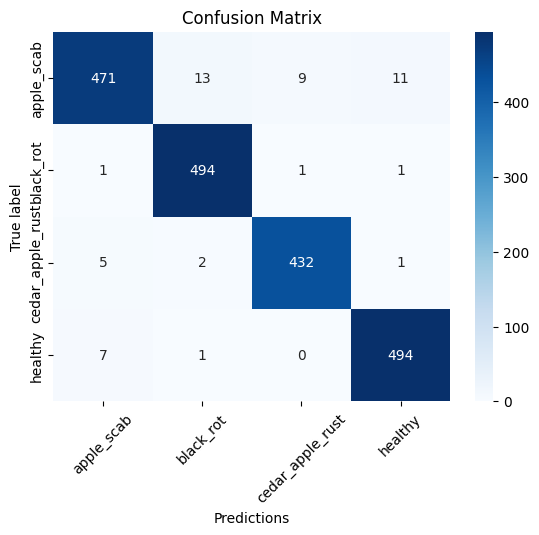

In [ ]:
import seaborn as sns
conf_mat = confusion_matrix(true_label,predictions)
sns.heatmap(conf_mat ,fmt='g',annot = True , cmap='Blues' , xticklabels=test_classes , yticklabels = test_classes,)
plt.xlabel('Predictions')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.xticks(rotation = 45)
plt.show()

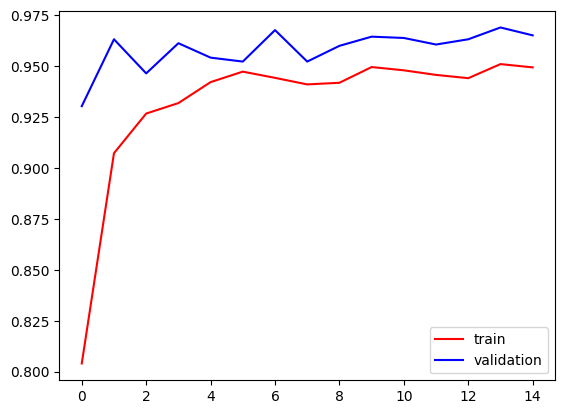

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], color = 'red', label = 'train')
plt.plot(history.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.show()

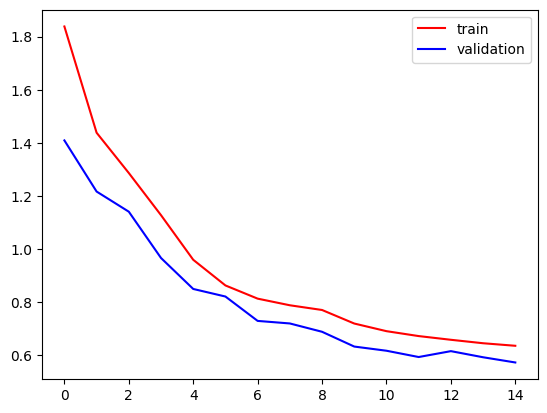

In [ ]:
plt.plot(history.history['loss'], color = 'red', label = 'train')
plt.plot(history.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.show()

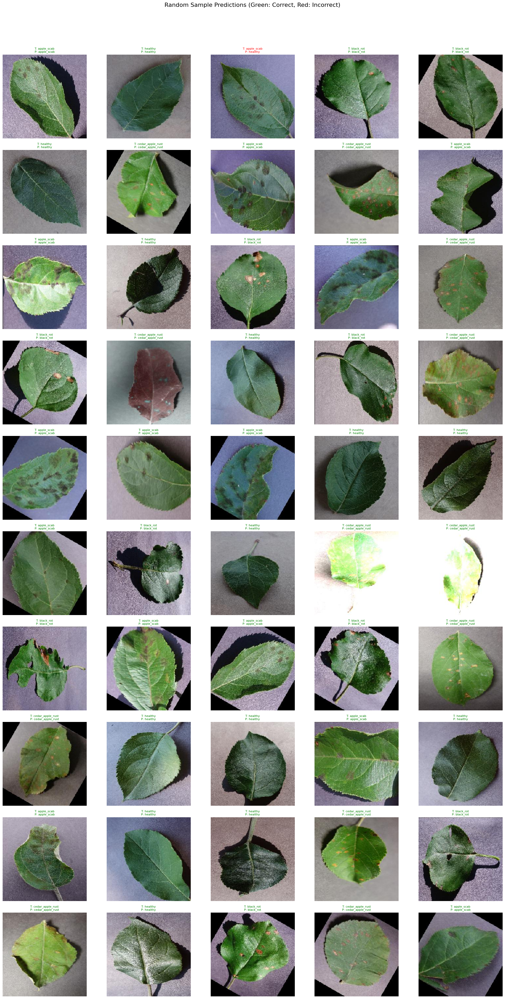

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from tensorflow.keras.preprocessing import image # For loading images
from tensorflow.keras.applications.resnet import preprocess_input # Ensure this matches your model's preprocessing

# --- Ensure these are defined from your previous notebook execution ---
# pretrained_model
# test_folder
# test_ds # Still useful for class_indices
# -------------------------------------------------------------------

# Get class names and index mapping
if 'class_names' not in locals() or class_names is None:
    class_names = list(test_ds.class_indices.keys())
    idx_to_class = {v: k for k, v in test_ds.class_indices.items()}
else:
    idx_to_class = {v: k for k, v in test_ds.class_indices.items()}

# Get all image file paths in the test set
all_test_image_paths = []
for class_name in class_names:
    class_dir = os.path.join(test_folder, class_name)
    for img_name in os.listdir(class_dir):
        all_test_image_paths.append(os.path.join(class_dir, img_name))

# Shuffle and select a random subset of image paths
random.shuffle(all_test_image_paths)
num_images_to_display = 50
selected_image_paths = all_test_image_paths[:num_images_to_display]

# Lists to store loaded images, true labels, and predictions
original_images = []
processed_images_for_prediction = []
true_labels_list = []

# Load, preprocess, and get true labels for selected images
for img_path in selected_image_paths:
    # Load image
    img = image.load_img(img_path, target_size=(224, 224))
    original_images.append(img) # Store original for display

    # Preprocess image for model prediction
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) # Add batch dimension
    processed_img = preprocess_input(img_array)
    processed_images_for_prediction.append(processed_img[0]) # Store the processed image (remove batch dim)

    # Determine true label from file path
    true_class_name_from_path = os.path.basename(os.path.dirname(img_path))
    true_labels_list.append(test_ds.class_indices[true_class_name_from_path])

# Convert processed images list to numpy array for batch prediction
processed_images_for_prediction = np.array(processed_images_for_prediction)

# Make predictions on the selected batch of processed images
predictions_prob = pretrained_model.predict(processed_images_for_prediction, verbose=0)
predicted_labels_indices = np.argmax(predictions_prob, axis=1)

# Plotting
plt.figure(figsize=(20, int(np.ceil(num_images_to_display / 5)) * 4)) # Adjust figure size dynamically
plt.suptitle('Random Sample Predictions (Green: Correct, Red: Incorrect)', fontsize=16)

for i in range(num_images_to_display):
    ax = plt.subplot(int(np.ceil(num_images_to_display / 5)), 5, i + 1) # Arrange in rows of 5

    # Display the original image
    plt.imshow(original_images[i])

    true_class_name = idx_to_class[true_labels_list[i]]
    predicted_class_name = idx_to_class[predicted_labels_indices[i]]

    color = "green" if true_labels_list[i] == predicted_labels_indices[i] else "red"
    border_width = 4 # Increased border width for visibility

    ax.set_title(f"T: {true_class_name}\nP: {predicted_class_name}", color=color, fontsize=8)
    plt.axis("off")

    # Add border to the image
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(border_width)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make space for suptitle
plt.show()